In [ ]:
# Code to generate Figures 4f and 4g as well as 

In [ ]:
import sys
from hsi_detect.utils import *
import numpy as np
import scipy
import json
import matplotlib
import plotly.express as px
from sklearn.cluster import MiniBatchKMeans

from datetime import date
today = date.today()
date_str = today.strftime('%d%b%Y')
print ('Date prefix:', date_str)


import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['lines.linewidth'] = 0.5
mpl.rcParams['axes.linewidth']= 0.5
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['xtick.minor.width'] = 0.5
mpl.rcParams['ytick.major.width'] = 0.5
mpl.rcParams['ytick.minor.width'] = 0.5
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rcParams['font.size'] = 7

Date prefix: 16Aug2024


In [3]:
IMAGE_PATH = '00_data/100108_biology_flight2_high_2023_07_18_11_58_52/raw_0_rd_rf_or.hdr'


savedir = '/'.join(IMAGE_PATH.split('/')[:-1])+f'{IMAGE_PATH.split("/")[-1].split(".hdr")[0]}_outputs_from_analysis/'

print (savedir)
if not os.path.isdir(savedir):
    os.mkdir(savedir)
    print ('Made directory:', savedir)

00_data/100108_biology_flight2_high_2023_07_18_11_58_52raw_0_rd_rf_or_outputs_from_analysis/
Made directory: 00_data/100108_biology_flight2_high_2023_07_18_11_58_52raw_0_rd_rf_or_outputs_from_analysis/


/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_75984/2896473088.py:11: RuntimeWarning: invalid value encountered in true_divide
  img = unnormalized_img / np.nanmax(unnormalized_img, axis=2, keepdims=True)


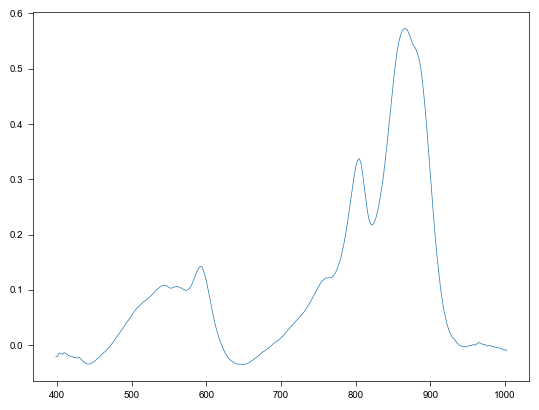

In [4]:
# Open image 
lib = envi.open(IMAGE_PATH)
centers = lib.bands.centers
unnormalized_img = smooth_img_spectrum(open_image(IMAGE_PATH).load(), window_size=11)

# Normalize image
img = unnormalized_img / np.nanmax(unnormalized_img, axis=2, keepdims=True)

# Load absorbance data
reference_file = np.load('00_data/absorbance_data/YF10_infered_absorbance_from_pellets_09Jul2024.npy')

reference_wls = reference_file[0,:]
reference_spec = reference_file[1,:] #*.1

reference_spec = np.interp(centers, reference_wls, reference_spec)
plt.figure()
plt.plot(centers, reference_spec)
plt.show()

(1220, 682, 3) (1220, 682, 1)


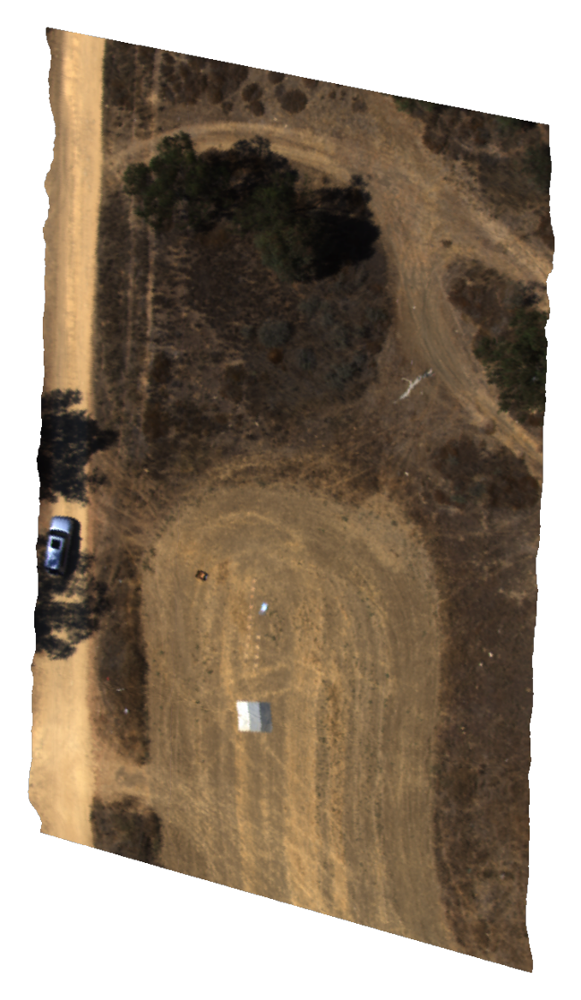

In [5]:
# visualize image
whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8]).astype(np.float64)

alpha_layer = ((1-np.isnan(img[:,:,0]))[:,:,np.newaxis]*255).astype(int)
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2).astype(int)


plt.figure(dpi=300)
plt.imshow(whole_rgb)

plt.box(False)
plt.xticks([])
plt.yticks([])
plt.savefig(savedir+f'{date_str}_reconstructed_RGB.png', dpi=300, transparent=True)
plt.show()

In [7]:
### Perform image classification

img_flattened= np.reshape(img, (img.shape[0]*img.shape[1], img.shape[2]))
img_flattened = img_flattened / np.nanmax(img_flattened, axis=1, keepdims=True)
em_ls, clust_ls = kmeans_hierarchical_extract_endmembers(img, return_cluster_idxs=True, 
                                                             reference_spec=reference_spec, 
                                                             reduced_dims=3,
                                                             filter_threshold=0.9)
mat = np.vstack([-reference_spec, em_ls[0]])
scored_img = UCLS(img_flattened, mat)

scored_img = np.reshape(scored_img[:,0], img.shape[:2])
scored_img[scored_img<0] = 0

/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_75984/1565352499.py:2: RuntimeWarning: All-NaN slice encountered
  img_flattened = img_flattened / np.nanmax(img_flattened, axis=1, keepdims=True)
/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:1109: RuntimeWarning: All-NaN slice encountered
  img_flattened = img_flattened / np.nanmax(img_flattened, axis=1, keepdims=True)
/Users/Itai/opt/anaconda3/envs/spectral/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1930: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Before filtering: 1000 endmembers
After filtering: 1000 endmembers


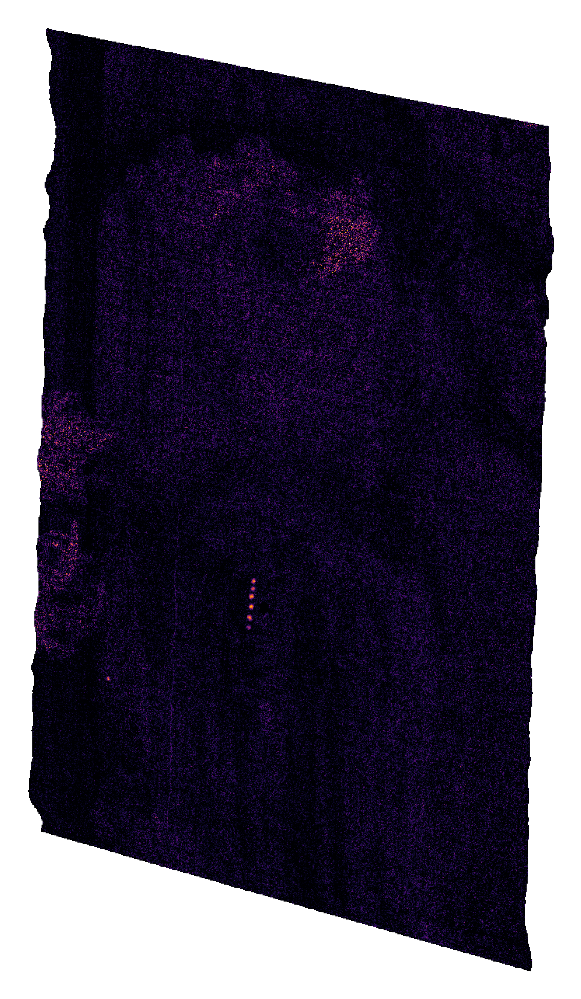

In [14]:
# Visualize classified image

plt.figure(dpi=500)
plt.imshow(scored_img, vmin=0, vmax=0.4, cmap='inferno')
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.show()

In [15]:
if os.path.exists(f'{savedir}/manually_defined_rectangle_coordinates.json'):
    with open(f'{savedir}/manually_defined_rectangle_coordinates.json', 'r') as f:
        coords = json.load(f)
        rectangle_tls = coords['TL']
        rectangle_brs = coords['BR']
    print ('Loaded!')


Loaded!


In [16]:
if not os.path.exists(f'{savedir}/manually_defined_rectangle_coordinates.json'):
    GET_RGB_FROM_HSI = False
    from dash import Dash, dcc, html, Input, Output, callback
    cmap = plt.get_cmap('tab20')

    external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

    app = Dash(__name__, external_stylesheets=external_stylesheets)
    rgb = whole_rgb
    ##DONT CROP
    window_to_show = [[0,np.max(rgb.shape[0])],[0,np.max(rgb.shape[1])]]
    ##

    if GET_RGB_FROM_HSI:
        fig = px.imshow((220*rgb[window_to_show[0][0]:window_to_show[0][1], 
                           window_to_show[1][0]:window_to_show[1][1]]).astype(dtype=np.uint8))
    else:
        
        fig = px.imshow((254*rgb[window_to_show[0][0]:window_to_show[0][1], 
                           window_to_show[1][0]:window_to_show[1][1]]).astype(dtype=np.uint8))
    rectangle_tls = []
    rectangle_trs = []
    rectangle_brs = []
    rectangle_bls = []
    COUNT= 0
    im_id = 0
    ls = []

    styles = {
        'pre': {
            'border': 'thin lightgrey solid',
            'overflowX': 'scroll'
        }
    }

    app.layout = html.Div([ 
        html.Div([dcc.Graph(id='img',figure=fig)]),
        html.Div(
            [
                dcc.Markdown("Top Left"),
                html.Pre(id='tl', style=styles['pre'])
            ],
        className='two columns'
        ),
        html.Div(
            [
                dcc.Markdown("Bottom Right"),
                html.Pre(id='br', style=styles['pre'])
            ],
        className='two columns'
        ),

    ])


    COUNT = 0
    SELECTED = []
    @callback(
        Output('tl', 'children'),
        Output('br', 'children'),
        Input('img', 'clickData'),
        Input('img', 'figure')
    )
    def onclick_x(clickData, fig):
        global rectangle_tls, rectangle_brs, COUNT, im_id, l    
        if clickData is not None:
            x= int(clickData['points'][0]['x'])
            y= int(clickData['points'][0]['y'])
            adj_x = x+window_to_show[1][0] 
            adj_y = y+window_to_show[0][0]
            if COUNT % 2 == 0:
                rectangle_tls.append([adj_y,adj_x])
                SELECTED.append([adj_y,adj_x])
                COUNT+=1
            elif COUNT % 2 == 1:
                rectangle_brs.append([adj_y,adj_x])
                SELECTED.append([adj_y,adj_x])
                COUNT+=1

        else:
            pass




    #     return [str({i:l[i] for i in range(len(l))})for l in [rectangle_tls, rectangle_trs, rectangle_brs,rectangle_bls]]
        return [str({i:l[i] for i in range(len(l))})for l in [rectangle_tls, rectangle_brs]]

    if __name__ == '__main__':
        app.run()
        # app.run(ip, port=np.random.choice(range(8300,8900)), debug=True)

In [17]:
if not os.path.exists(f'{savedir}//manually_defined_rectangle_coordinates.json'):
    with open(f'{savedir}//manually_defined_rectangle_coordinates.json', 'w') as f:
        json.dump({'TL':rectangle_tls,'BR':rectangle_brs},f)

In [18]:

masks = make_rectangle_mask(img.shape, zip(rectangle_tls, rectangle_brs))


spec_fxn = lambda x : np.nanmean(x, axis=(0,1))
mean_spec_ls = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), spec_fxn)


max_abs_idx = np.argmax(reference_spec)
peak_fxn = lambda x : np.mean(x[:, :, max_abs_idx])
normed_peak_of_interest = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), peak_fxn)
unnormed_peak_of_interest = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), peak_fxn)



mean_fxn = lambda x : np.nanmean(x)
# mean_fxn = lambda x : np.nanmean( np.max(np.stack([x, np.zeros_like(x)], axis=1)) )
mean_scores = apply_function_to_rectangles (scored_img, zip(rectangle_tls, rectangle_brs), mean_fxn)


sum_fxn = lambda x : np.nansum(x)
sum_scores = apply_function_to_rectangles (scored_img, zip(rectangle_tls, rectangle_brs), sum_fxn)

conc_map = pd.read_csv('00_data/100108_biology_flight2_high_2023_07_18_11_58_52/plates_col1_labels.csv', header=None)

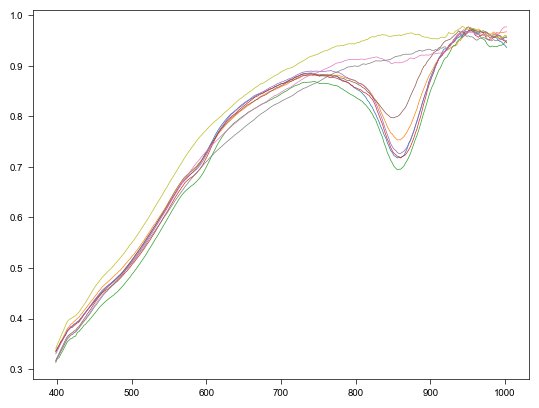

In [20]:
for i in range(len(conc_map)):
    plt.plot(centers,mean_spec_ls[i])

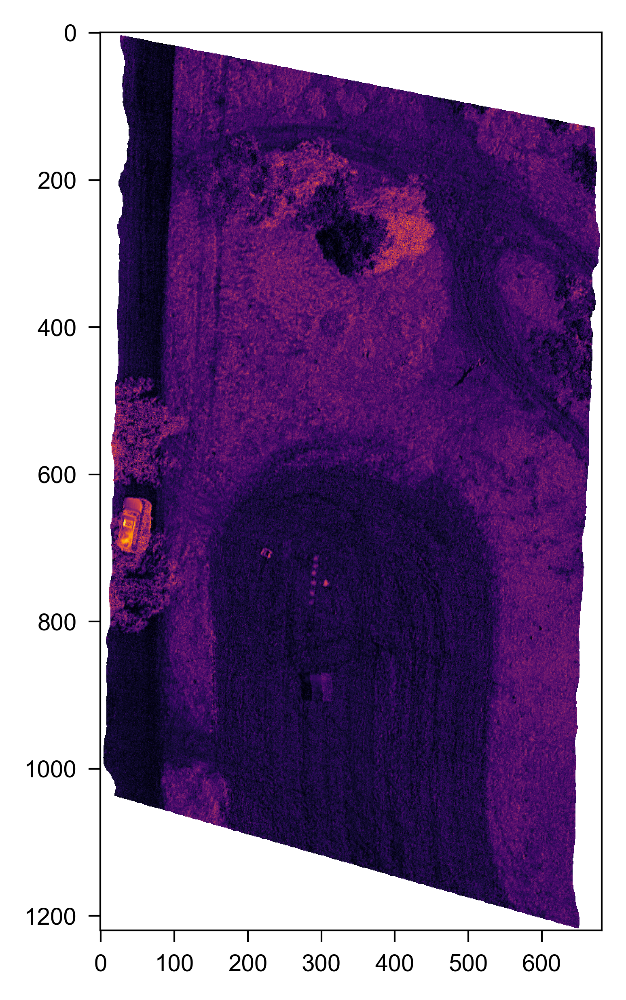

In [21]:
plt.figure(dpi=600)
plt.imshow(img[:,:,max_abs_idx], cmap='inferno_r')
plt.show()

In [22]:
from matplotlib.ticker import LogLocator

Saved to: 00_data/100108_biology_flight2_high_2023_07_18_11_58_52raw_0_rd_rf_or_outputs_from_analysis//16Aug2024_col1_insitu_RG_classified_hill_plot.pdf
FITTING
DONE FITTING
['ymax: 0.0112', 'ymin: 0.2200', 'K: 5.0592', 'n: 30.5535']


/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:568: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 

/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:571: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 



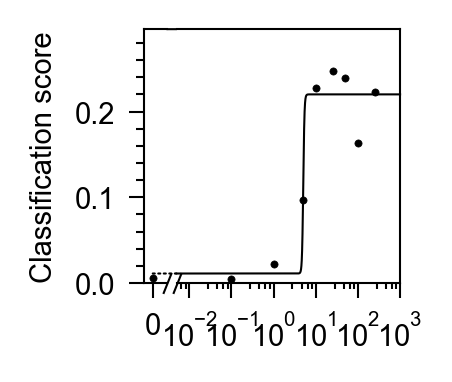

In [27]:
plt.rcParams['font.size']=7

# x  300 mL per 1000g * 1000uM / nM


od = 4
vol = 300
cfu_per_ml_per_od = 1.044e9
cfu = cfu_per_ml_per_od * od * vol
area = .35*.3 #cm^2
mass = 1000

cfu = area * cfu / (mass)

s = np.array(mean_scores) #/ cfu  * area 

print ("Saved to:", f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot.pdf')

# what are these concentrations?
concs_transformed = conc_map.loc[:,0].values #* 300e-3 / 1000 * 1000

plot_fit_curve(concs_transformed,
                   s,
                   hill_eqn, 
                   [0.5e-2,1e3],
                   [-0.,np.max(s)*1.2],
                   f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot.pdf',
                   ymax_bound=np.max(s)*3,
                 figsize=(1.1,1.1), markersize=3,
               x_offset=2e-6, 
               ylabel = 'Classification score'
                  )

In [28]:
unnormed_img = np.array(lib.load())
unnormed_peak_of_interest = apply_function_to_rectangles (unnormed_img, zip(rectangle_tls, rectangle_brs), peak_fxn)


[ 0.1454826   0.11659294  0.17969579  0.16096336  0.14957672  0.08340538
  0.04061794  0.00569105  0.        ]
Saved to: 00_data/100108_biology_flight2_high_2023_07_18_11_58_52raw_0_rd_rf_or_outputs_from_analysis//16Aug2024_col1_insitu_RG_classified_hill_plot_unnormed_reflectance_at-866.969.pdf
FITTING
DONE FITTING
['ymax: 0.0073', 'ymin: 0.1535', 'K: 3.3352', 'n: 1.6050']


/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:568: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 

/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:571: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 



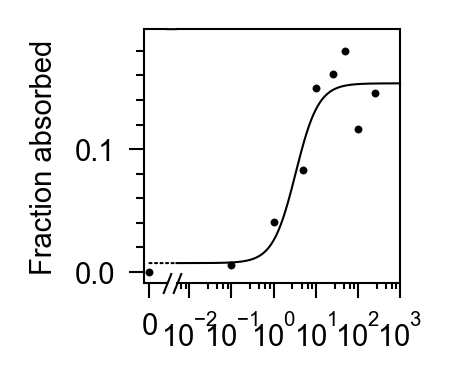

In [29]:
s = 1-np.array(unnormed_peak_of_interest)
 
s = s - np.nanmin(s)
print (s)
savename = f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot_unnormed_reflectance_at-{centers[max_abs_idx]}.pdf'
print ("Saved to:", f'{savename}')
plot_fit_curve(conc_map.loc[:,0].values,
                   s,
                   hill_eqn, 
                   [0.5e-2,1e3],
#                    [-np.nanmax(s)*0.01, np.nanmax(s)],
                   [-np.nanmax(s)*0.05,np.nanmax(s)*1.1],
                   savename,
                    line_color = 'black',
                    marker_color='black', edgecolor=None,
                 figsize=(1.1,1.1), markersize=3,x_offset=1e-6, 
                  )

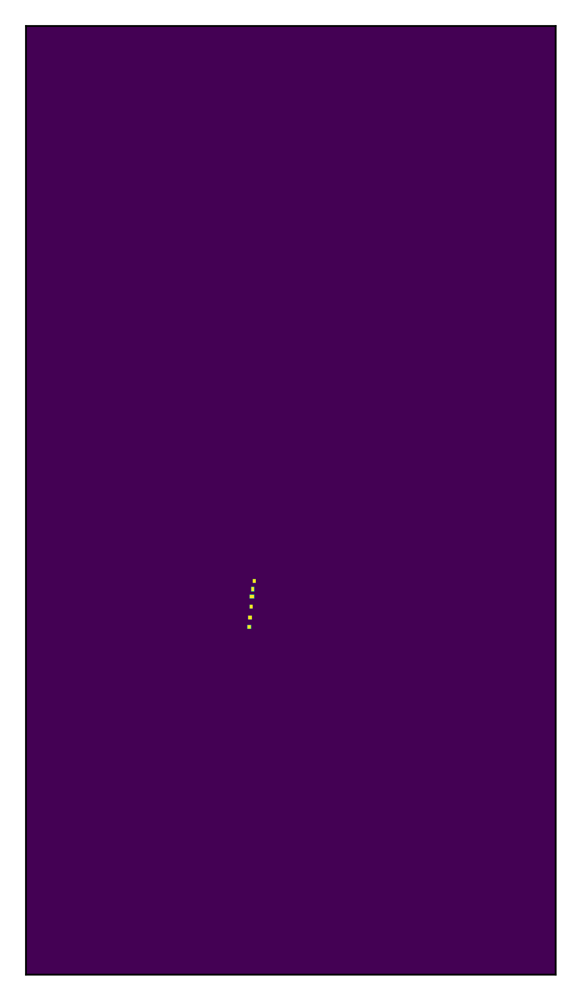

In [31]:
pos_mask_idxs = conc_map.index[conc_map[0]>=5]


mask = make_rectangle_mask(img.shape[:2], zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]))

plt.figure(dpi=400)
plt.imshow(mask)
plt.xticks([])
plt.yticks([])
plt.show()

(1220, 682, 3) (1220, 682, 1)


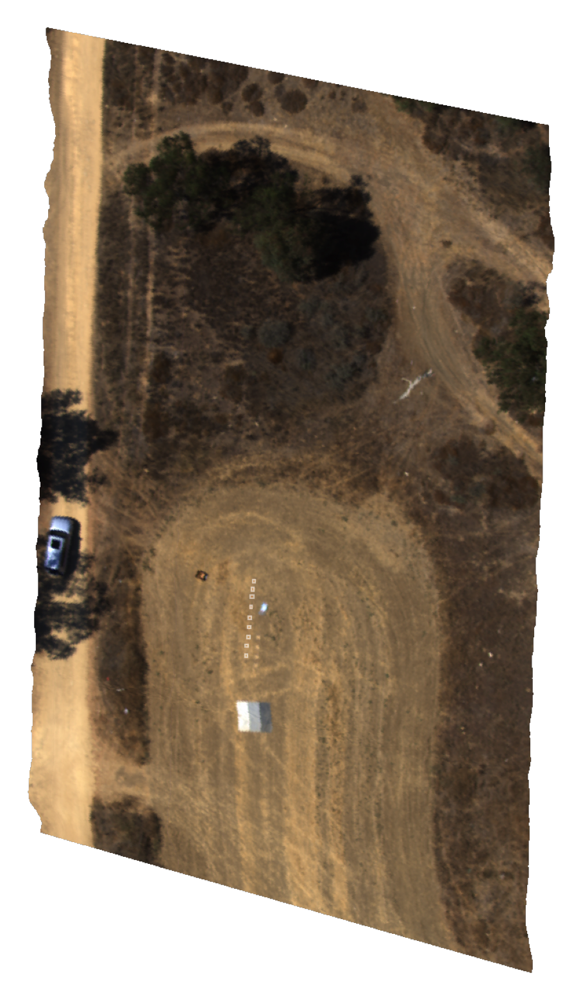

In [32]:
f, ax = plt.subplots(1, dpi=400)

whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8])

alpha_layer = ((1-np.isnan(img[:,:,0]))[:,:,np.newaxis]*255).astype(int)
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2).astype(int)



ax.imshow(whole_rgb/255)

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='white', linewidth=0.4, alpha=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[6:9]), np.array(rectangle_brs[6:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='white', linewidth=0.4, alpha=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_high-flight_rgb_img_with_rectangles_marked.pdf', transparent=True)

In [33]:
whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8]).astype(np.float64)
alpha_layer = (1-np.isnan(img[:,:,0])).astype(np.float64)[:,:,np.newaxis]
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2)
print (whole_rgb.shape)

(1220, 682, 3) (1220, 682, 1)
(1220, 682, 4)


In [34]:
#label as "positive" the pixels within the rectangles of 10^1 and above? 

image_y = flatten_array(mask)

class 0.970118262663
abs 0.24332953182


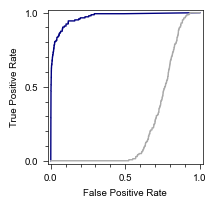

In [35]:
# import numpy as np
from sklearn.metrics import roc_curve, precision_recall_curve, auc
# import matplotlib.pyplot as plt

# Example data
# y_true = np.array([0, 1, 0, 1, 1, 0, 1, 0, 0, 1])
# y_scores = np.array([0.1, 0.4, 0.35, 0.8, 0.65, 0.2, 0.7, 0.3, 0.4, 0.9])


y_scores = flatten_array(scored_img.copy())
y_true = image_y.copy()
y_abs = 1-flatten_array(unnormed_img[:,:,np.argmax(reference_spec)])


y_true = y_true[~np.isnan(y_scores)]
y_abs = y_abs[~np.isnan(y_scores)]
y_scores = y_scores[~np.isnan(y_scores)]



# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
class_roc_auc = auc(fpr, tpr)


abs_fpr, abs_tpr, abs_thresholds = roc_curve(y_true, y_abs)
abs_roc_auc =  auc(abs_fpr, abs_tpr)

# Plotting the ROC curve
plt.figure(figsize=(2,2))
plt.plot(fpr, tpr, color='navy', lw=1, label='ROC curve (area = %0.2f)' % class_roc_auc)
print ('class', class_roc_auc)
plt.plot(abs_fpr, abs_tpr, color='darkgray', lw=1, label='ROC curve (area = %0.2f)' % abs_roc_auc)
print ('abs', abs_roc_auc)
# plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xticks([0,0.5,1])
plt.yticks([0,0.5,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# plt.legend(loc="lower right")
plt.minorticks_on()
plt.savefig(f'{savedir}/{date_str}_classification_ROC_curve.pdf')
plt.show()

In [ ]:
# import numpy as np
from sklearn.metrics import roc_curve, precision_recall_curve, auc
# import matplotlib.pyplot as plt

# Example data
# y_true = np.array([0, 1, 0, 1, 1, 0, 1, 0, 0, 1])
# y_scores = np.array([0.1, 0.4, 0.35, 0.8, 0.65, 0.2, 0.7, 0.3, 0.4, 0.9])


y_scores = flatten_array(scored_img.copy())
y_true = image_y.copy()
y_abs = 1-flatten_array(unnormed_img[:,:,np.argmax(reference_spec)])
y_abs_norm_max = 1-flatten_array(unnormed_img[:,:,np.argmax(reference_spec)]) / flatten_array(np.nanmax(unnormed_img, axis=2))
y_abs_norm_sum = 1-flatten_array(unnormed_img[:,:,np.argmax(reference_spec)]) / flatten_array(np.nansum(unnormed_img, axis=2))


y_true = y_true[~np.isnan(y_scores)]
y_abs = y_abs[~np.isnan(y_scores)]

y_abs_norm_max = y_abs_norm_max[~np.isnan(y_scores)]
y_abs_norm_sum = y_abs_norm_sum[~np.isnan(y_scores)]
y_scores = y_scores[~np.isnan(y_scores)]


# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
class_roc_auc = auc(fpr, tpr)


abs_fpr, abs_tpr, abs_thresholds = roc_curve(y_true, y_abs)
abs_roc_auc =  auc(abs_fpr, abs_tpr)

max_fpr, max_tpr, max_thresholds = roc_curve(y_true, y_abs_norm_max)
max_roc_auc =  auc(max_fpr, max_tpr)

sum_fpr, sum_tpr, sum_thresholds = roc_curve(y_true, y_abs_norm_sum)
sum_roc_auc =  auc(sum_fpr, sum_tpr)



# Plotting the ROC curve
plt.figure(figsize=(2,2))
plt.plot(fpr, tpr, color='navy', lw=1, label='ROC curve (area = %0.2f)' % class_roc_auc)
print ('class', class_roc_auc)
plt.plot(abs_fpr, abs_tpr, color='darkgray', lw=1, label='ROC curve (area = %0.2f)' % abs_roc_auc)


plt.plot(max_fpr, max_tpr, color='orange', lw=1, label='ROC curve (area = %0.2f)' % max_roc_auc)
plt.plot(sum_fpr, sum_tpr, color='red', lw=1, label='ROC curve (area = %0.2f)' % sum_roc_auc)

print ('abs', abs_roc_auc)
# plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xticks([0,0.5,1])
plt.yticks([0,0.5,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.minorticks_on()
# plt.savefig(f'{savedir}/{date_str}_classification_ROC_curve.pdf')
plt.show()

In [ ]:
if not os.path.isdir(f'{savedir}/roc_supp/'):
    os.mkdir(f'{savedir}/roc_supp/')
    print (f'Made directory: {savedir}/roc_supp/')
    
from matplotlib.colors import ListedColormap
cmap = ListedColormap(["whitesmoke", "crimson"])

figsize = (img.shape[1]/300, img.shape[0]/300)

In [ ]:
nanmask

In [ ]:
target_fpr_ls = [0,0.001, 0.01,0.05, 0.5,] #np.linspace(0,1,21)

def binarize (arr, thresh):
    arr = arr.copy()
    arr[arr<thresh] = 0
    arr[arr>thresh] = 1 
    return arr#.astype(bool)

nanmask = img[:,:,max_abs_idx].copy()
nanmask[~np.isnan(nanmask)] = 1


for t in target_fpr_ls:
    thresh_idx = np.argmin(np.abs(abs_fpr-t))
    abs_set_thresh = abs_thresholds[thresh_idx]
    savename = f'{savedir}/roc_supp/'+'abs_thresh_img_fpr-{:.3f}_tpr-{:.3f}_thresh-{:.2f}.pdf'.format(abs_fpr[thresh_idx], abs_tpr[thresh_idx], abs_set_thresh)
    print (f'fpr: {abs_fpr[thresh_idx]}, tpr: {abs_tpr[thresh_idx]}, thresh: {abs_set_thresh}')

    
    plt.figure(figsize=figsize, dpi=300)
    plt.imshow(binarize(1-unnormed_img[:,:,max_abs_idx], abs_set_thresh).astype(float)*nanmask, cmap=cmap, vmin=0, vmax=1, 
               aspect='equal', interpolation='none')
    
    
        
    plt.xticks([])
    plt.yticks([])
    plt.box(False)
    plt.tight_layout()
    
    plt.savefig(savename.replace('.pdf', '.png'), dpi=300, transparent=True)
    
    # draw rectangle
    for tl, br in zip(np.array(rectangle_tls[:9]), np.array(rectangle_brs[:9])):
        w = br[1] - tl[1]
        h = br[0] - tl[0]
        square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='black', linewidth=0.4, alpha=1)
        plt.gca().add_patch(square)

    
    print (savename)
    plt.tight_layout()

    plt.savefig(savename, dpi=300)
    plt.show()
    
    
for t in target_fpr_ls:
    thresh_idx = np.argmin(np.abs(fpr-t))
    score_set_thresh = thresholds[thresh_idx]
    savename = f'{savedir}/roc_supp/'+'scored_thresh_img_fpr-{:.3f}_tpr-{:.3f}_thresh-{:.2f}.pdf'.format(fpr[thresh_idx], tpr[thresh_idx], score_set_thresh)
    
    print (f'fpr: {fpr[thresh_idx]}, tpr: {tpr[thresh_idx]}, thresh: {score_set_thresh}')
    
    
    plt.figure(figsize=figsize, dpi=300)
    
    plt.imshow(binarize(scored_img, score_set_thresh).astype(float)*nanmask, cmap=cmap, vmin=0, vmax=1, 
               aspect='equal', interpolation='none')
    
    plt.xticks([])
    plt.yticks([])
    plt.box(False)
    plt.tight_layout()
    
    plt.savefig(savename.replace('.pdf', '.png'), dpi=300, transparent=True)
    # draw rectangle
    for tl, br in zip(np.array(rectangle_tls[:9]), np.array(rectangle_brs[:9])):
        w = br[1] - tl[1]
        h = br[0] - tl[0]
        square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='black', linewidth=0.2, alpha=1)
        plt.gca().add_patch(square)
    

    
    print (savename)
    plt.tight_layout()

    plt.savefig(savename, dpi=300)
    
    plt.show()

In [ ]:
for t in target_fpr_ls:
    thresh_idx = np.argmin(np.abs(max_fpr-t))
    max_set_thresh = max_thresholds[thresh_idx]
    print (f'fpr: {max_fpr[thresh_idx]}, tpr: {max_tpr[thresh_idx]}, thresh: {max_set_thresh}')

    
    plt.figure(figsize=figsize, dpi=300)
    plt.imshow(binarize(1-img[:,:,max_abs_idx], max_set_thresh).astype(float)*nanmask, cmap=cmap, vmin=0, vmax=1, 
               aspect='equal', interpolation='none')
    # draw rectangle
    for tl, br in zip(np.array(rectangle_tls[:9]), np.array(rectangle_brs[:9])):
        w = br[1] - tl[1]
        h = br[0] - tl[0]
        square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='black', linewidth=0.4, alpha=1)
        plt.gca().add_patch(square)
    
    plt.xticks([])
    plt.yticks([])
    plt.box(False)
    plt.tight_layout()
    plt.show()

In [ ]:
nanmask = img[:,:,max_abs_idx].copy()
nanmask[~np.isnan(nanmask)] = 1
nanmask

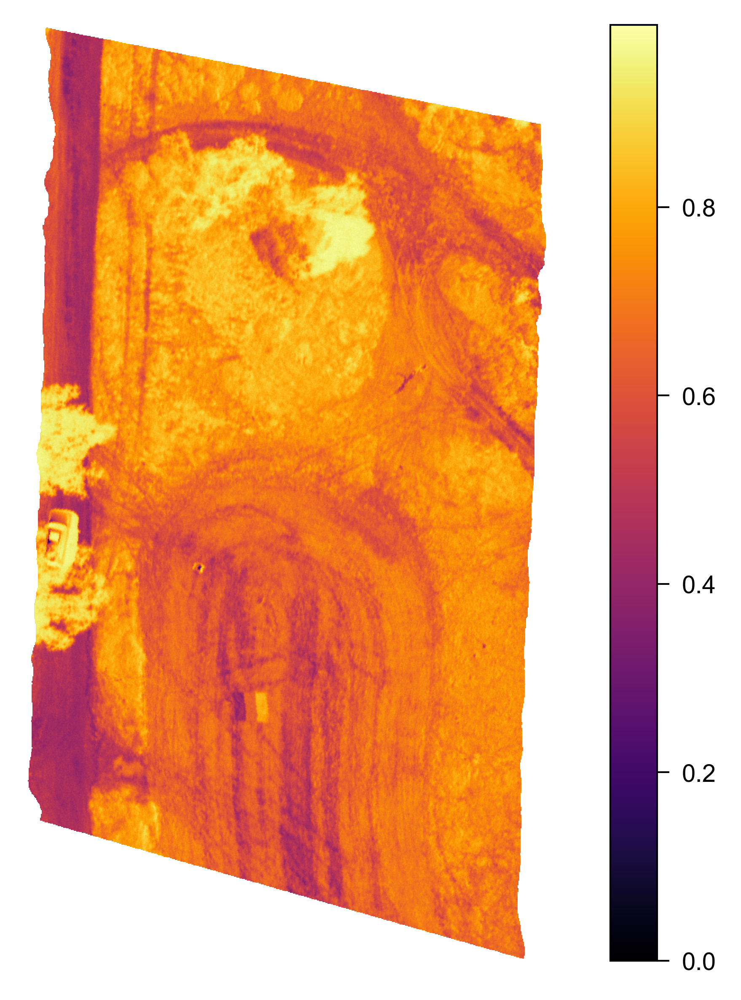

In [37]:
plt.figure(dpi=600)
unnormed_img[unnormed_img==0] = np.nan
plt.imshow(1-unnormed_img[:,:,max_abs_idx], cmap='inferno', vmin=0)
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.colorbar()
plt.savefig(f'{savedir}/unnormalized_image_at-{centers[max_abs_idx]}.png', dpi=400)
plt.show()